In [1]:
import os
import pandas as pd   # importing and manipulating data
import numpy as np    # for performing linear algebric functions
import matplotlib.pyplot as plt    #visualization of data
plt.style.use('ggplot')
import seaborn as sns

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import re
from nltk.tokenize import WordPunctTokenizer
tok = WordPunctTokenizer()

In [2]:
onlineexam_df1 = pd.read_csv('E:/Project 5 credits/Final Project/onlineexams.csv',  sep='\t')
onlineexam_df2 = pd.read_csv('E:/Project 5 credits/Final Project/onlineexams1.csv',  sep='\t')

c:\users\nimes\appdata\local\programs\python\python37\lib\site-packages\IPython\core\interactiveshell.py:3166: DtypeWarning: Columns (9) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [3]:
onlineexams = pd.concat([onlineexam_df1,onlineexam_df2], ignore_index=True)

onlineexams

,id,conversation_id,created_at,date,time,timezone,user_id,username,name,place,...,geo,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest
0,1322325372516663303,1322325372516663303,2020-10-31 05:21:51 Sri Lanka Standard Time,2020-10-31,05:21:51,530,1313486797414989826,tutoring_pro,Tutoring Pro,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
1,1322325283962261504,1322325283962261504,2020-10-31 05:21:29 Sri Lanka Standard Time,2020-10-31,05:21:29,530,1313486797414989826,tutoring_pro,Tutoring Pro,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
2,1322324670268387328,1322324670268387328,2020-10-31 05:19:03 Sri Lanka Standard Time,2020-10-31,05:19:03,530,1015832514533810177,kweneamor_,u look so cool,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
3,1322324497416900608,1322324497416900608,2020-10-31 05:18:22 Sri Lanka Standard Time,2020-10-31,05:18:22,530,1399849608,julietalaboc_,julie,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
4,1322324485706567681,1322324485706567681,2020-10-31 05:18:19 Sri Lanka Standard Time,2020-10-31,05:18:19,530,3855754102,pboogz_,Pboogz👾,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79165,1322695252852035584,1322631122333900800,2020-11-01 05:51:37 Sri Lanka Standard Time,2020-11-01,05:51:37,530,2571440278,scorpio1114x,T 🌸,NaN,...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'teachingaeons', 'name': 'Mrs...",NaN,NaN,NaN,NaN
79166,1322695233017204736,1322695233017204736,2020-11-01 05:51:32 Sri Lanka Standard Time,2020-11-01,05:51:32,530,1299620370216087553,online_writers1,Assignment & Essay Writers +1 (626) 469-3898,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
79167,1322693292438417409,1322693292438417409,2020-11-01 05:43:50 Sri Lanka Standard Time,2020-11-01,05:43:50,530,1322689716588720128,priyans11094046,Priyanshu Kumar Tiwary,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
79168,1322692102203961344,1322692102203961344,2020-11-01 05:39:06 Sri Lanka Standard Time,2020-11-01,05:39:06,530,1322689716588720128,priyans11094046,Priyanshu Kumar Tiwary,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN


In [4]:
onlineexams.info(null_counts=True)

c:\users\nimes\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: null_counts is deprecated. Use show_counts instead
  """Entry point for launching an IPython kernel.


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79170 entries, 0 to 79169
Data columns (total 36 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               79170 non-null  int64  
 1   conversation_id  79170 non-null  int64  
 2   created_at       79170 non-null  object 
 3   date             79170 non-null  object 
 4   time             79170 non-null  object 
 5   timezone         79170 non-null  int64  
 6   user_id          79170 non-null  int64  
 7   username         79170 non-null  object 
 8   name             79169 non-null  object 
 9   place            16 non-null     object 
 10  tweet            79170 non-null  object 
 11  language         79170 non-null  object 
 12  mentions         79170 non-null  object 
 13  urls             79170 non-null  object 
 14  photos           79170 non-null  object 
 15  replies_count    79170 non-null  int64  
 16  retweets_count   79170 non-null  int64  
 17  likes_count 

In [5]:
onlineexams.dtypes

id                   int64
conversation_id      int64
created_at          object
date                object
time                object
timezone             int64
user_id              int64
username            object
name                object
place               object
tweet               object
language            object
mentions            object
urls                object
photos              object
replies_count        int64
retweets_count       int64
likes_count          int64
hashtags            object
cashtags            object
link                object
retweet               bool
quote_url           object
video                int64
thumbnail           object
near               float64
geo                float64
source             float64
user_rt_id         float64
user_rt            float64
retweet_id         float64
reply_to            object
retweet_date       float64
translate          float64
trans_src          float64
trans_dest         float64
dtype: object

<AxesSubplot:>

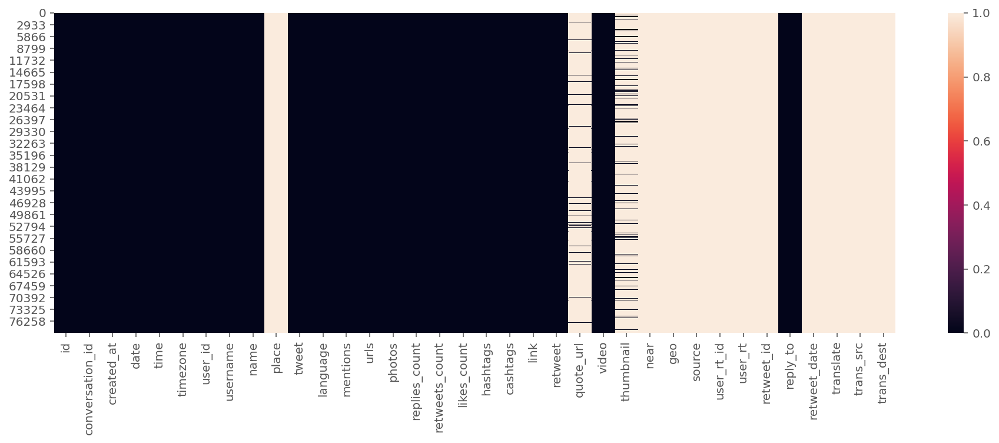

In [6]:
# check for null value in data
plt.figure(figsize = (16,5))
sns.heatmap(onlineexams.isnull())

In [7]:
import plotly.express as px

missed = pd.DataFrame()
missed['column'] = onlineexams.columns

missed['percent'] = [round(100* onlineexams[col].isnull().sum() / len(onlineexams), 2) for col in onlineexams.columns]
missed = missed.sort_values('percent')
missed = missed[missed['percent']>0]

fig = px.bar(
    missed, 
    x='percent', 
    y="column", 
    orientation='h', 
    title='Missed values percent for every column (percent > 0)', 
    height=400, 
    width=600
)

fig.show()

In [8]:
onlineexams.corr()

,id,conversation_id,timezone,user_id,replies_count,retweets_count,likes_count,retweet,video,near,geo,source,user_rt_id,user_rt,retweet_id,retweet_date,translate,trans_src,trans_dest
id,1.000000,0.470174,NaN,0.090398,-0.007781,-0.008845,-0.009469,NaN,-0.031117,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
conversation_id,0.470174,1.000000,NaN,0.038971,-0.002581,-0.003702,-0.003776,NaN,-0.009635,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
timezone,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
user_id,0.090398,0.038971,NaN,1.000000,-0.043007,-0.001204,-0.012120,NaN,-0.067026,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
replies_count,-0.007781,-0.002581,NaN,-0.043007,1.000000,0.233892,0.603756,NaN,0.010037,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
retweets_count,-0.008845,-0.003702,NaN,-0.001204,0.233892,1.000000,0.821578,NaN,0.002251,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
likes_count,-0.009469,-0.003776,NaN,-0.012120,0.603756,0.821578,1.000000,NaN,0.004106,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
retweet,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
video,-0.031117,-0.009635,NaN,-0.067026,0.010037,0.002251,0.004106,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
near,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Text(0.5, 1.0, 'Correlation Heatmap')

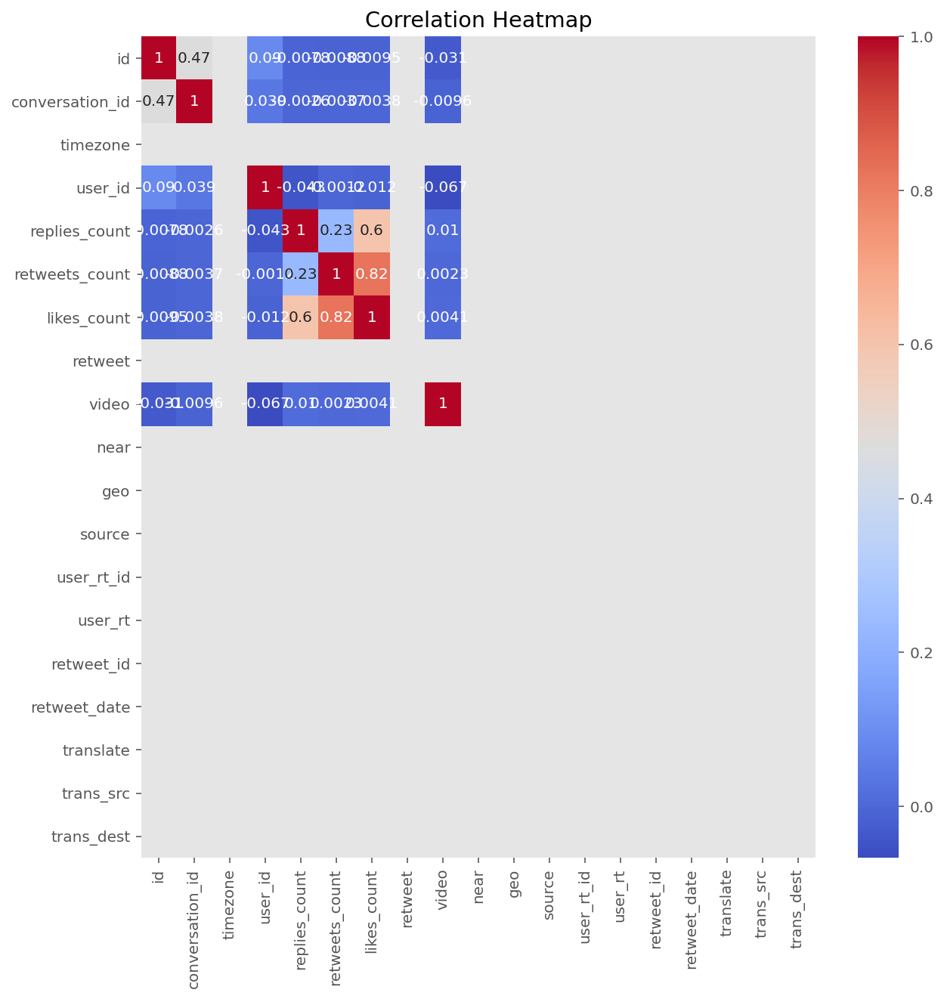

In [9]:
plt.figure(figsize=(10,10))
sns.heatmap(onlineexams.corr(), annot=True, cmap="coolwarm").set_title('Correlation Heatmap')

In [10]:
df_new = onlineexams['username'].value_counts().reset_index()
df_new.columns = ['username', 'tweets_count']
df_new = df_new.sort_values(['tweets_count'])

fig = px.bar(
    df_new.tail(20), 
    x="tweets_count", 
    y="username", 
    orientation='h', 
    title='Top 20 users by number of tweets', 
    width=800, 
    height=800
)

fig.show()

In [11]:
df_new.tail(10)

,username,tweets_count
9,scotte_mike,296
8,writingreliable,353
7,academichelpp,381
6,cristinaessays,391
5,perfectgraders,393
4,bestonlinewrit3,415
3,blairgrading,442
2,essaydoyen,478
1,online_writers1,618
0,custompapers5,1187


In [12]:
onlineexams= pd.merge(onlineexams, df_new, on='username')

In [13]:
onlineexams.drop(['hashtags','cashtags','thumbnail','source','user_rt','retweet_id','reply_to','retweet_date','translate','trans_src','trans_dest', 'timezone', 'name', 'created_at', 'user_id', 'place', 'likes_count', 'link', 'retweet', 'quote_url', 'video', 'user_rt_id', 'near', 'geo', 'mentions', 'urls', 'photos', 'replies_count', 'retweets_count','conversation_id'], axis = 1, inplace = True)
onlineexams.drop_duplicates()
onlineexams.head()

,id,date,time,username,tweet,language,tweets_count
0,1322325372516663303,2020-10-31,05:21:51,tutoring_pro,We guarantee quality grades in; #Essays #onli...,en,283
1,1322325283962261504,2020-10-31,05:21:29,tutoring_pro,Let us write a quality original custom content...,en,283
2,1322277328454619136,2020-10-31,02:10:56,tutoring_pro,Pay us to tackle your; Fall classes Online cl...,en,283
3,1322270124871745536,2020-10-31,01:42:19,tutoring_pro,Kindly let us assist you Group #discussion pos...,en,283
4,1322269941022732289,2020-10-31,01:41:35,tutoring_pro,Instant help available√ Fall classes Pay essa...,en,283


In [14]:
onlineexams.info(null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 79170 entries, 0 to 79169
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   id            79170 non-null  int64 
 1   date          79170 non-null  object
 2   time          79170 non-null  object
 3   username      79170 non-null  object
 4   tweet         79170 non-null  object
 5   language      79170 non-null  object
 6   tweets_count  79170 non-null  int64 
dtypes: int64(2), object(5)
memory usage: 4.8+ MB


c:\users\nimes\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

null_counts is deprecated. Use show_counts instead



In [15]:
onlineexams.dtypes

id               int64
date            object
time            object
username        object
tweet           object
language        object
tweets_count     int64
dtype: object

<AxesSubplot:>

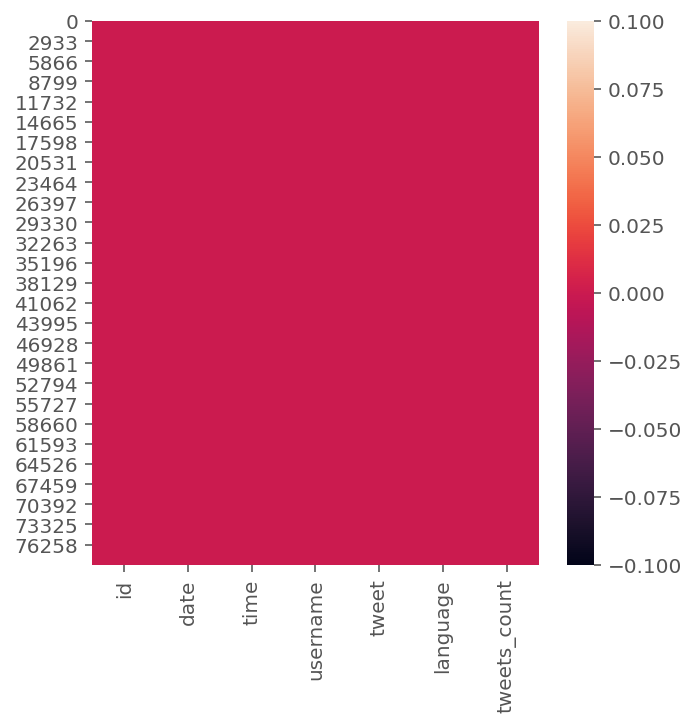

In [16]:
# check for null value in data
plt.figure(figsize = (5,5))
sns.heatmap(onlineexams.isnull())

Text(0.5, 1.0, 'Correlation Heatmap After Dropping Null Val')

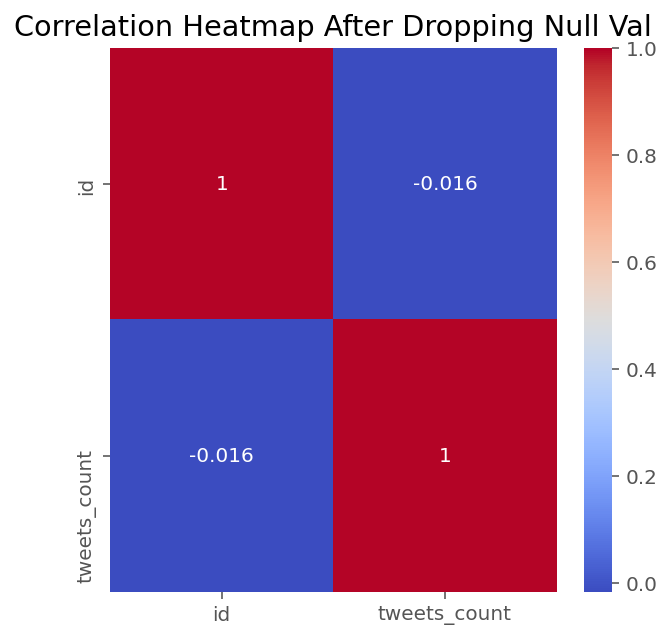

In [17]:
plt.figure(figsize=(5,5))
sns.heatmap(onlineexams.corr(), annot=True, cmap="coolwarm").set_title('Correlation Heatmap After Dropping Null Val')

In [18]:
df_english_only = onlineexams[onlineexams['language'] == 'en']
df_english_only.head()

,id,date,time,username,tweet,language,tweets_count
0,1322325372516663303,2020-10-31,05:21:51,tutoring_pro,We guarantee quality grades in; #Essays #onli...,en,283
1,1322325283962261504,2020-10-31,05:21:29,tutoring_pro,Let us write a quality original custom content...,en,283
2,1322277328454619136,2020-10-31,02:10:56,tutoring_pro,Pay us to tackle your; Fall classes Online cl...,en,283
3,1322270124871745536,2020-10-31,01:42:19,tutoring_pro,Kindly let us assist you Group #discussion pos...,en,283
4,1322269941022732289,2020-10-31,01:41:35,tutoring_pro,Instant help available√ Fall classes Pay essa...,en,283


In [19]:
df_english_only.info(null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 69416 entries, 0 to 79169
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   id            69416 non-null  int64 
 1   date          69416 non-null  object
 2   time          69416 non-null  object
 3   username      69416 non-null  object
 4   tweet         69416 non-null  object
 5   language      69416 non-null  object
 6   tweets_count  69416 non-null  int64 
dtypes: int64(2), object(5)
memory usage: 4.2+ MB


c:\users\nimes\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

null_counts is deprecated. Use show_counts instead



In [20]:
onlineexams = pd.concat([df_english_only], ignore_index=True)

In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import collections
import re
import networkx as nx

import nltk
from nltk.corpus import stopwords
stopwords=set(stopwords.words('english'))
from nltk.util import ngrams
from nltk import bigrams
nltk.download('stopwords')

import warnings
warnings.filterwarnings("ignore")

%matplotlib inline
sns.set(font_scale=1.5)
sns.set_style("whitegrid")
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()
%config InlineBackend.figure_format = 'retina'

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\nimes\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [22]:
df_new = onlineexams[onlineexams['tweet'].notnull()]
df_new['text'] = df_new['tweet'].apply(lambda x: ' '.join([item for item in x.split() if item not in stopwords]))
print(df_new)

                        id        date      time         username  \
0      1322325372516663303  2020-10-31  05:21:51     tutoring_pro   
1      1322325283962261504  2020-10-31  05:21:29     tutoring_pro   
2      1322277328454619136  2020-10-31  02:10:56     tutoring_pro   
3      1322270124871745536  2020-10-31  01:42:19     tutoring_pro   
4      1322269941022732289  2020-10-31  01:41:35     tutoring_pro   
...                    ...         ...       ...              ...   
69411  1322697033489272833  2020-11-01  05:58:41       suttonboy1   
69412  1322696514439847936  2020-11-01  05:56:38         frvanmet   
69413  1322695252852035584  2020-11-01  05:51:37     scorpio1114x   
69414  1322693292438417409  2020-11-01  05:43:50  priyans11094046   
69415  1322692102203961344  2020-11-01  05:39:06  priyans11094046   

                                                   tweet language  \
0      We guarantee quality grades in; #Essays  #onli...       en   
1      Let us write a quality ori

In [23]:
#Remove Urls and HTML links
def remove_urls(text):
    url_remove = re.compile(r'https?://\S+|www\.\S+')
    return url_remove.sub(r'', text)
df_new['text']=df_new['text'].apply(lambda x:remove_urls(x))

def remove_html(text):
    html=re.compile(r'<.*?>')
    return html.sub(r'',text)
df_new['text']=df_new['text'].apply(lambda x:remove_html(x))

# Lower casing
def lower(text):
    low_text= text.lower()
    return low_text
df_new['text']=df_new['text'].apply(lambda x:lower(x))

# Number removal
def remove_num(text):
    remove= re.sub(r'\d+', '', text)
    return remove
df_new['text']=df_new['text'].apply(lambda x:remove_num(x))

def punct_remove(text):
    punct = re.sub(r"[^\w\s\d]","", text)
    return punct
df_new['text']=df_new['text'].apply(lambda x:punct_remove(x))

def remove_mention(x):
    text=re.sub(r'@\w+','',x)
    return text
df_new['text']=df_new['text'].apply(lambda x:remove_mention(x))

def remove_hash(x):
    text=re.sub(r'#\w+','',x)
    return text
df_new['text']=df_new['text'].apply(lambda x:remove_hash(x))


#Remove extra white space left while removing stuff
def remove_space(text):
    space_remove = re.sub(r"\s+"," ",text).strip()
    return space_remove
df_new['text']=df_new['text'].apply(lambda x:remove_space(x))

###########################################################################################################

'''
def clean(text):
    text = re.sub('https?://\S+|www\.\S+', '', text)  
    text = re.sub(r'\s+', ' ', text, flags=re.I)
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub(r'@\w+','',text)
    text = re.sub(r'#\w+','',text)
    return text   
df_new['text'] = df_new['text'].apply(lambda x:clean(x))
'''

from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyser = SentimentIntensityAnalyzer()
scores=[]
for i in range(len(df_new['text'])):
    
    score = analyser.polarity_scores(df_new['text'][i])
    score=score['compound']
    scores.append(score)
sentiment=[]
for i in scores:
    if i>=0.05:
        sentiment.append('Positive')
    elif i<=(-0.05):
        sentiment.append('Negative')
    else:
        sentiment.append('Neutral')
df_new['sentiment']=pd.Series(np.array(sentiment))

In [24]:
df_new.head()

,id,date,time,username,tweet,language,tweets_count,text,sentiment
0,1322325372516663303,2020-10-31,05:21:51,tutoring_pro,We guarantee quality grades in; #Essays #onli...,en,283,we guarantee quality grades in essays online c...,Positive
1,1322325283962261504,2020-10-31,05:21:29,tutoring_pro,Let us write a quality original custom content...,en,283,let us write quality original custom content a...,Positive
2,1322277328454619136,2020-10-31,02:10:56,tutoring_pro,Pay us to tackle your; Fall classes Online cl...,en,283,pay us tackle your fall classes online class e...,Negative
3,1322270124871745536,2020-10-31,01:42:19,tutoring_pro,Kindly let us assist you Group #discussion pos...,en,283,kindly let us assist group discussion posts ma...,Positive
4,1322269941022732289,2020-10-31,01:41:35,tutoring_pro,Instant help available√ Fall classes Pay essa...,en,283,instant help available fall classes pay essay ...,Positive


(-0.5, 399.5, 199.5, -0.5)

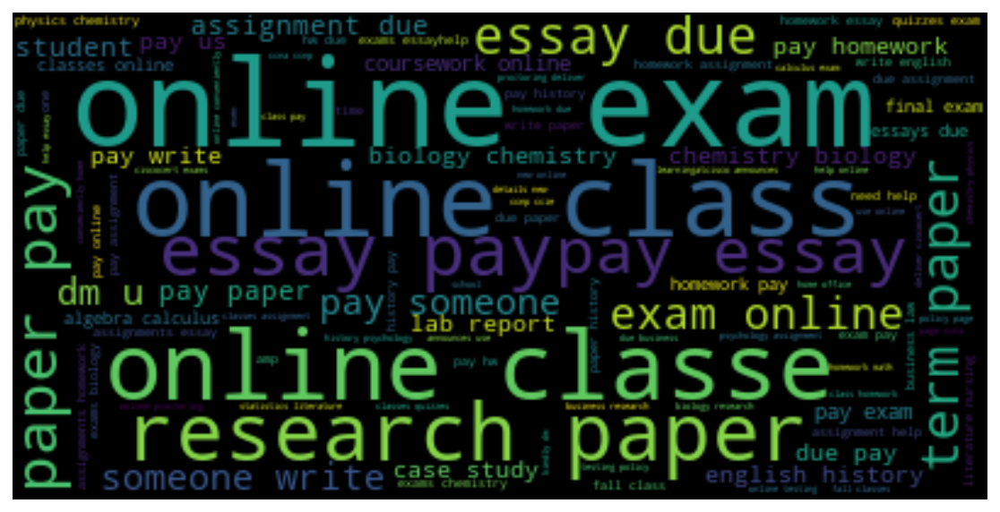

In [25]:
from wordcloud import WordCloud, STOPWORDS , ImageColorGenerator

tweet_All = " ".join(review for review in df_new.text)


fig, ax = plt.subplots(1, 1, figsize  = (16,5))
# Create and generate a word cloud image:
wordcloud_ALL = WordCloud(max_font_size=50, max_words=100, background_color="black").generate(tweet_All)

# Display the generated image:
ax.imshow(wordcloud_ALL, interpolation='bilinear')

ax.axis('off')

In [26]:
df_new['text']

0        we guarantee quality grades in essays online c...
1        let us write quality original custom content a...
2        pay us tackle your fall classes online class e...
3        kindly let us assist group discussion posts ma...
4        instant help available fall classes pay essay ...
                               ...                        
69411    peitho jonatha svaugnie neunion thatsmanderley...
69412    cmon instructorssay online proctored exams aut...
69413    teachingaeons spitfirecc im yr gw announced re...
69414    cbseindia preboard examination rd november th ...
69415    drrpnishank preboard examination rd november t...
Name: text, Length: 69416, dtype: object

In [27]:
temp = df_new.groupby('sentiment').count()['text'].reset_index().sort_values(by='text',ascending=False)
temp.style.background_gradient(cmap='Purples')

,sentiment,text
2,Positive,35593
0,Negative,19188
1,Neutral,14635


<AxesSubplot:xlabel='sentiment', ylabel='count'>

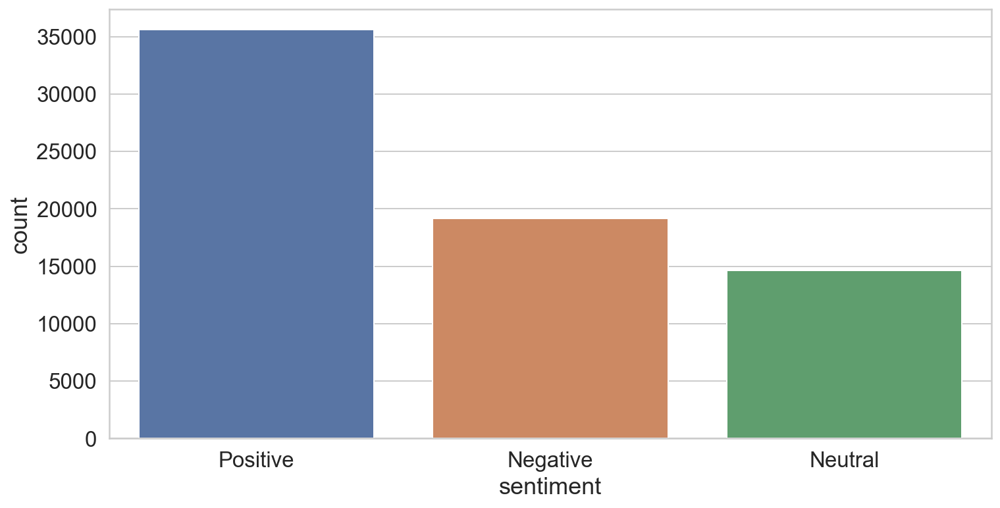

In [28]:
plt.figure(figsize=(12,6))
sns.countplot(x='sentiment',data=df_new)

In [29]:
import plotly.graph_objs as go

fig = go.Figure(go.Funnelarea(
    text =temp.sentiment,
    values = temp.text,
    title = {"position": "top center", "text": "Funnel-Chart of Sentiment Distribution"}
    ))
fig.show()

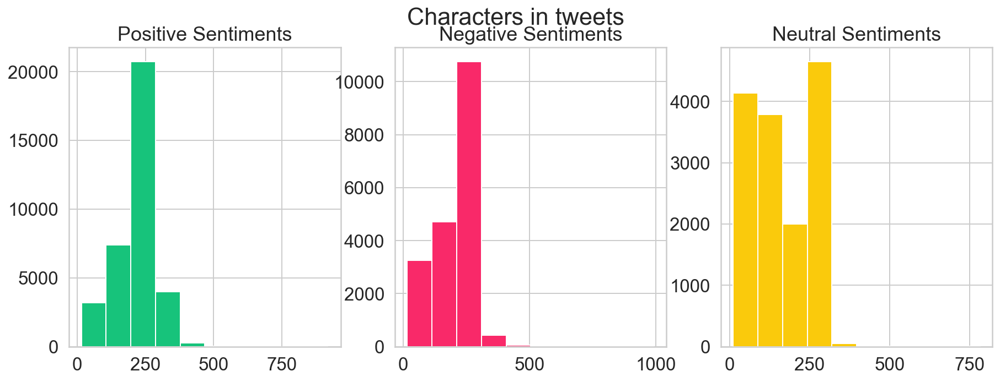

In [30]:
fig,(ax1,ax2,ax3)=plt.subplots(1,3,figsize=(15,5))

tweet_len=df_new[df_new['sentiment']=="Positive"]['tweet'].str.len()
ax1.hist(tweet_len,color='#17C37B')
ax1.set_title('Positive Sentiments')

tweet_len=df_new[df_new['sentiment']=="Negative"]['tweet'].str.len()
ax2.hist(tweet_len,color='#F92969')
ax2.set_title('Negative Sentiments')

tweet_len=df_new[df_new['sentiment']=="Neutral"]['tweet'].str.len()
ax3.hist(tweet_len,color='#FACA0C')
ax3.set_title('Neutral Sentiments')

fig.suptitle('Characters in tweets')
plt.show()

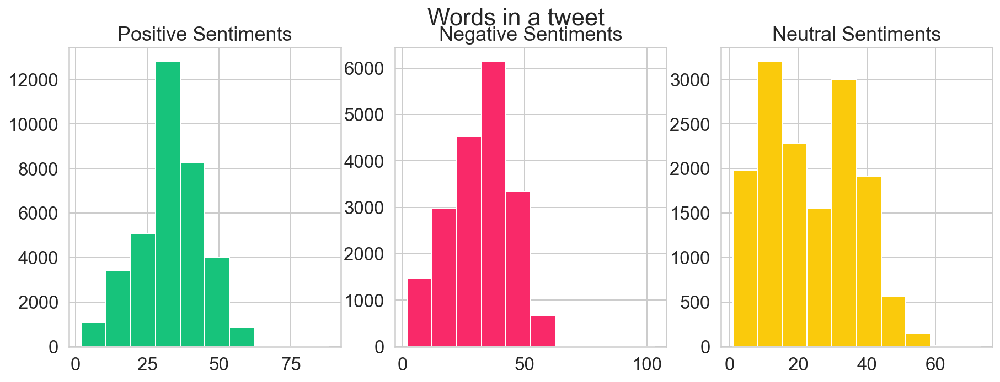

In [31]:
fig,(ax1,ax2,ax3)=plt.subplots(1,3,figsize=(15,5))

tweet_len=df_new[df_new['sentiment']=="Positive"]['tweet'].str.split().map(lambda x: len(x))
ax1.hist(tweet_len,color='#17C37B')
ax1.set_title('Positive Sentiments')


tweet_len=df_new[df_new['sentiment']=="Negative"]['tweet'].str.split().map(lambda x: len(x))
ax2.hist(tweet_len,color='#F92969')
ax2.set_title('Negative Sentiments')

tweet_len=df_new[df_new['sentiment']=="Neutral"]['tweet'].str.split().map(lambda x: len(x))
ax3.hist(tweet_len,color='#FACA0C')
ax3.set_title('Neutral Sentiments')

fig.suptitle('Words in a tweet')
plt.show()

Text(0.5, 0.98, 'Average word length in each tweet')

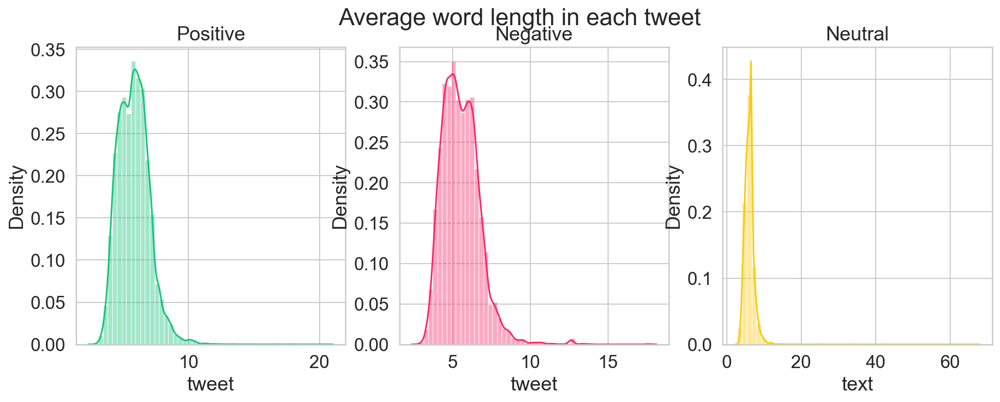

In [32]:
fig,(ax1,ax2, ax3)=plt.subplots(1,3,figsize=(15,5))

word=df_new[df_new['sentiment']=="Positive"]['tweet'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax1,color='#17C37B')
ax1.set_title('Positive')


word=df_new[df_new['sentiment']=="Negative"]['tweet'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax2,color='#F92969')
ax2.set_title('Negative')

word=df_new[df_new['sentiment']=="Neutral"]['text'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax3,color='#FACA0C')
ax3.set_title('Neutral')


fig.suptitle('Average word length in each tweet')

In [33]:
def create_corpus(target):
    corpus=[]
    
    for x in df_new[df_new['sentiment']==target ]['text'].str.split():
        for i in x:
            corpus.append(i)
    return corpus


In [34]:
np.array(stopwords)

array({"shouldn't", 'by', 'a', 'why', 'll', 'above', 'for', 'when', 'was', 'below', 'hers', 'each', "you'd", 'under', 'has', "wasn't", 'after', 'o', 'shan', 'very', 'then', 'don', 'wasn', 'his', 'yourself', "doesn't", 'wouldn', 'd', 'is', 'have', "needn't", 'off', 're', 'isn', "you're", 'into', 'hadn', 'ain', "she's", 'its', 'couldn', 'and', 'not', 'ma', 'this', 'itself', 's', 'some', "hadn't", 'weren', 'we', 'our', 'himself', "that'll", 'an', 'if', 'mustn', "couldn't", 'during', 'only', 'your', "don't", 'at', 'my', 'their', 'these', 'mightn', 'should', 'doing', 'yourselves', 'am', "isn't", 'themselves', 'few', "should've", 'against', "aren't", 'shouldn', 'having', 'over', 'she', "it's", 'own', 'further', 'so', 'i', 'ours', 'won', 'y', 'me', 'all', 'he', 'because', 'other', 'which', "you've", 'the', 'does', 'doesn', 'once', 'about', 'do', "haven't", 'through', 'you', 'with', 'here', 'they', "mightn't", 'in', 'there', 'where', 'how', 'same', 'between', 'more', 'what', 'while', 'up', 'to

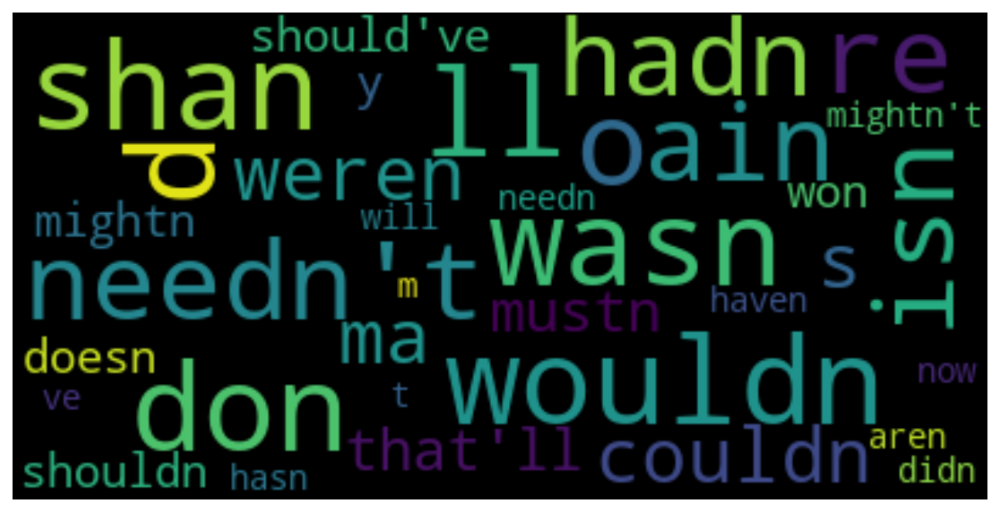

In [35]:
comment_words = '' 
stopwords1 = set(STOPWORDS) 
  
for val in stopwords: 
      
    # typecaste each val to string 
    val = str(val) 
    # split the value 
    tokens = val.split() 
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
  
fig, ax = plt.subplots(1, 1, figsize  = (16,5))
wordcloud_ALL = WordCloud(max_font_size=50, max_words=100, background_color="black").generate(comment_words)



# plot the WordCloud image                        
ax.imshow(wordcloud_ALL, interpolation='bilinear')
ax.axis('off')
  
plt.show() 


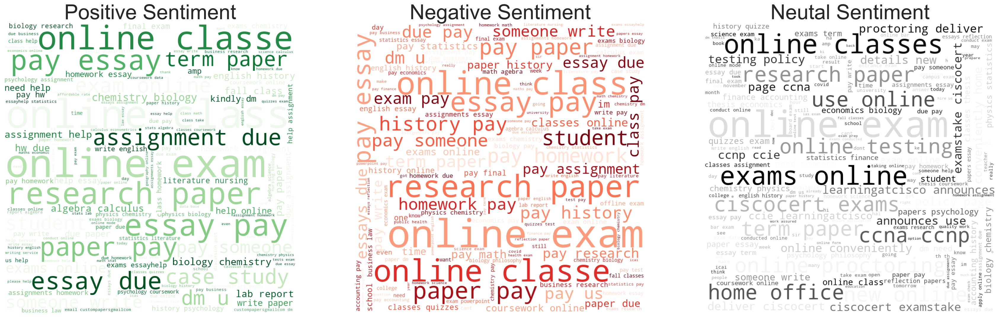

In [36]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=[30, 15])

df_pos = df_new[df_new["sentiment"]=="Positive"]
df_neg = df_new[df_new["sentiment"]=="Negative"]
df_neu = df_new[df_new["sentiment"]=="Neutral"]

comment_words = '' 
stopwords = set(STOPWORDS) 

for val in df_pos.text: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
   
wordcloud1 = WordCloud(width = 800, height = 800, 
                background_color ='white',
                colormap="Greens",
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 

ax1.imshow(wordcloud1)
ax1.axis('off')
ax1.set_title('Positive Sentiment',fontsize=35);

comment_words = ''

for val in df_neg.text: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
    
wordcloud2 = WordCloud(width = 800, height = 800, 
                background_color ='white',
                colormap="Reds",
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words)  
ax2.imshow(wordcloud2)
ax2.axis('off')
ax2.set_title('Negative Sentiment',fontsize=35);

comment_words = ''
for val in df_neu.text: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
    
wordcloud3 = WordCloud(width = 800, height = 800, 
                background_color ='white',
                colormap="Greys",
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 
ax3.imshow(wordcloud3)
ax3.axis('off')
ax3.set_title('Neutal Sentiment',fontsize=35);

In [37]:
from collections import defaultdict

# Define functions
def generate_ngrams(text, n_gram=1):
    token = [token for token in text.lower().split(' ') if token != '' if token not in STOPWORDS]
    ngrams = zip(*[token[i:] for i in range(n_gram)])
    return [' '.join(ngram) for ngram in ngrams]

N = 30


positive= df_new["sentiment"]== "Positive"
negative= df_new["sentiment"]== "Negative"
neutral= df_new["sentiment"]== "Neutral"

positive_unigrams = defaultdict(int)
neutral_unigrams = defaultdict(int)
negative_unigrams = defaultdict(int)

# Unigrams
for tweet in df_new[positive]['text']:
    for word in generate_ngrams(tweet):
        positive_unigrams[word] += 1
        
for tweet in df_new[negative]['text']:
    for word in generate_ngrams(tweet):
        negative_unigrams[word] += 1
        
for tweet in df_new[neutral]['text']:
    for word in generate_ngrams(tweet):
        neutral_unigrams[word] += 1        
        
df_positive_unigrams = pd.DataFrame(sorted(positive_unigrams.items(), key=lambda x: x[1])[::-1])
df_negative_unigrams = pd.DataFrame(sorted(negative_unigrams.items(), key=lambda x: x[1])[::-1])
df_neutral_unigrams = pd.DataFrame(sorted(neutral_unigrams.items(), key=lambda x: x[1])[::-1])


fig, axes = plt.subplots(ncols=3, figsize=(27, 30), dpi=150)
plt.tight_layout()

sns.barplot(y=df_positive_unigrams[0].values[:N], x=df_positive_unigrams[1].values[:N], ax=axes[0], color='#17C37B')
sns.barplot(y=df_negative_unigrams[0].values[:N], x=df_negative_unigrams[1].values[:N], ax=axes[1], color='#F92969')
sns.barplot(y=df_neutral_unigrams[0].values[:N], x=df_neutral_unigrams[1].values[:N], ax=axes[2], color='#FACA0C')


for i in range(3):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=20)
    axes[i].tick_params(axis='y', labelsize=30)

axes[0].set_title(f'Top {N} most common unigrams in Postive Tweets', fontsize=15)
axes[1].set_title(f'Top {N} most common unigrams in Negative Tweets', fontsize=15)
axes[2].set_title(f'Top {N} most common unigrams in Neutral Tweets', fontsize=15)

plt.show()

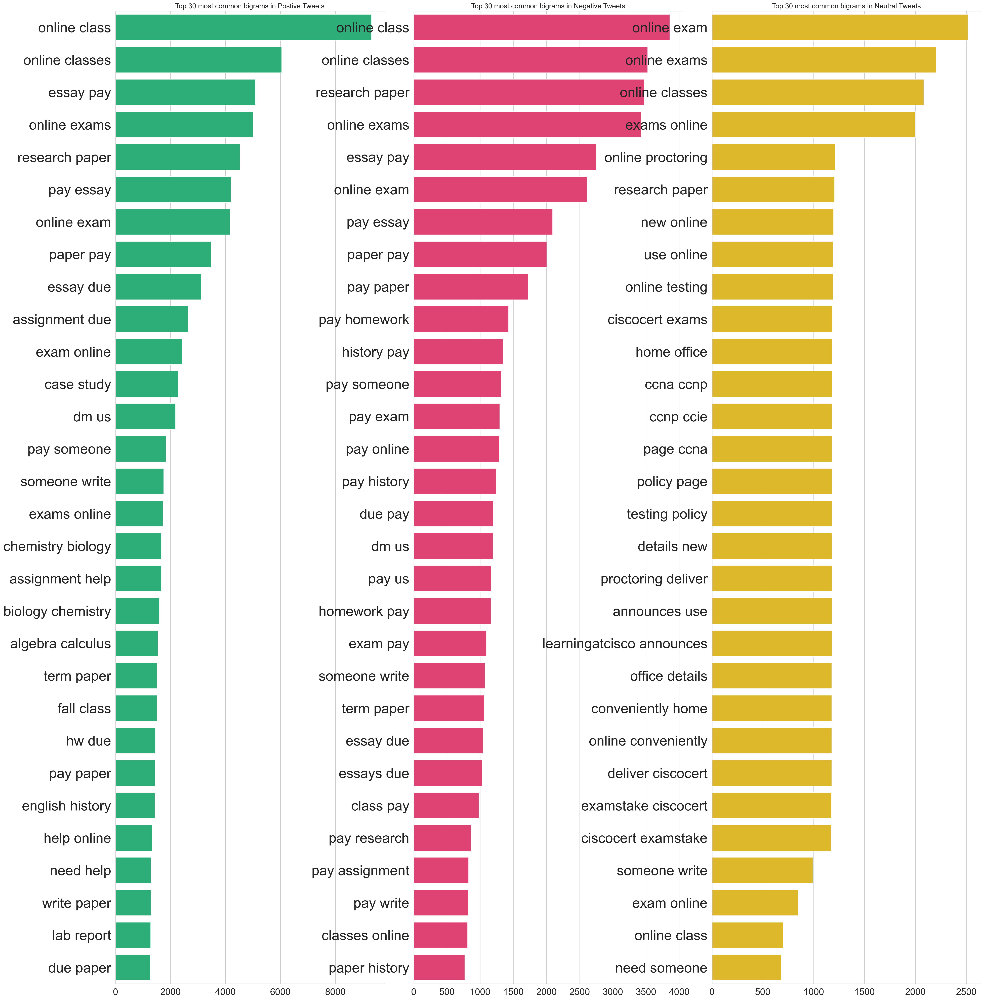

In [38]:
# Bigrams
positive_bigrams = defaultdict(int)
neutral_bigrams = defaultdict(int)
negative_bigrams = defaultdict(int)

for tweet in df_new[positive]['text']:
    for word in generate_ngrams(tweet, n_gram=2):
        positive_bigrams[word] += 1
        
for tweet in df_new[negative]['text']:
    for word in generate_ngrams(tweet, n_gram=2):
        negative_bigrams[word] += 1
        
for tweet in df_new[neutral]['text']:
    for word in generate_ngrams(tweet, n_gram=2):
        neutral_bigrams[word] += 1        
        
df_positive_bigrams = pd.DataFrame(sorted(positive_bigrams.items(), key=lambda x: x[1])[::-1])
df_negative_bigrams = pd.DataFrame(sorted(negative_bigrams.items(), key=lambda x: x[1])[::-1])
df_neutral_bigrams = pd.DataFrame(sorted(neutral_bigrams.items(), key=lambda x: x[1])[::-1])


fig, axes = plt.subplots(ncols=3, figsize=(27, 30), dpi=100)
plt.tight_layout()

sns.barplot(y=df_positive_bigrams[0].values[:N], x=df_positive_bigrams[1].values[:N], ax=axes[0], color='#17C37B')
sns.barplot(y=df_negative_bigrams[0].values[:N], x=df_negative_bigrams[1].values[:N], ax=axes[1], color='#F92969')
sns.barplot(y=df_neutral_bigrams[0].values[:N], x=df_neutral_bigrams[1].values[:N], ax=axes[2], color='#FACA0C')


for i in range(3):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=20)
    axes[i].tick_params(axis='y', labelsize=30)

axes[0].set_title(f'Top {N} most common bigrams in Postive Tweets', fontsize=15)
axes[1].set_title(f'Top {N} most common bigrams in Negative Tweets', fontsize=15)
axes[2].set_title(f'Top {N} most common bigrams in Neutral Tweets', fontsize=15)

plt.show()

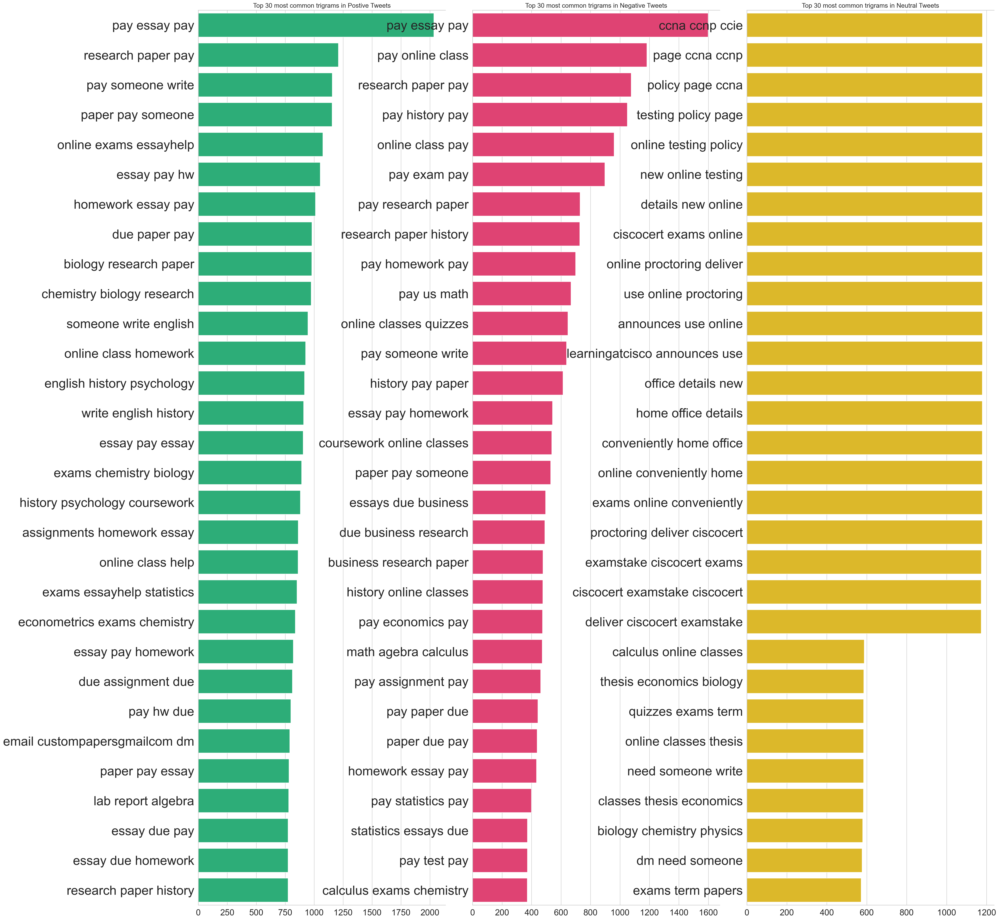

In [39]:
# Trigrams
positive_trigrams = defaultdict(int)
neutral_trigrams = defaultdict(int)
negative_trigrams = defaultdict(int)

for tweet in df_new[positive]['text']:
    for word in generate_ngrams(tweet, n_gram=3):
        positive_trigrams[word] += 1
        
for tweet in df_new[negative]['text']:
    for word in generate_ngrams(tweet, n_gram=3):
        negative_trigrams[word] += 1
        
for tweet in df_new[neutral]['text']:
    for word in generate_ngrams(tweet, n_gram=3):
        neutral_trigrams[word] += 1        
        
df_positive_trigrams = pd.DataFrame(sorted(positive_trigrams.items(), key=lambda x: x[1])[::-1])
df_negative_trigrams = pd.DataFrame(sorted(negative_trigrams.items(), key=lambda x: x[1])[::-1])
df_neutral_trigrams = pd.DataFrame(sorted(neutral_trigrams.items(), key=lambda x: x[1])[::-1])


fig, axes = plt.subplots(ncols=3, figsize=(27, 30), dpi=100)
plt.tight_layout()

sns.barplot(y=df_positive_trigrams[0].values[:N], x=df_positive_trigrams[1].values[:N], ax=axes[0], color='#17C37B')
sns.barplot(y=df_negative_trigrams[0].values[:N], x=df_negative_trigrams[1].values[:N], ax=axes[1], color='#F92969')
sns.barplot(y=df_neutral_trigrams[0].values[:N], x=df_neutral_trigrams[1].values[:N], ax=axes[2], color='#FACA0C')




for i in range(3):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=20)
    axes[i].tick_params(axis='y', labelsize=30)

axes[0].set_title(f'Top {N} most common trigrams in Postive Tweets', fontsize=15)
axes[1].set_title(f'Top {N} most common trigrams in Negative Tweets', fontsize=15)
axes[2].set_title(f'Top {N} most common trigrams in Neutral Tweets', fontsize=15)

plt.show()

In [40]:
df_new.head()

,id,date,time,username,tweet,language,tweets_count,text,sentiment
0,1322325372516663303,2020-10-31,05:21:51,tutoring_pro,We guarantee quality grades in; #Essays #onli...,en,283,we guarantee quality grades in essays online c...,Positive
1,1322325283962261504,2020-10-31,05:21:29,tutoring_pro,Let us write a quality original custom content...,en,283,let us write quality original custom content a...,Positive
2,1322277328454619136,2020-10-31,02:10:56,tutoring_pro,Pay us to tackle your; Fall classes Online cl...,en,283,pay us tackle your fall classes online class e...,Negative
3,1322270124871745536,2020-10-31,01:42:19,tutoring_pro,Kindly let us assist you Group #discussion pos...,en,283,kindly let us assist group discussion posts ma...,Positive
4,1322269941022732289,2020-10-31,01:41:35,tutoring_pro,Instant help available√ Fall classes Pay essa...,en,283,instant help available fall classes pay essay ...,Positive


In [41]:
df_new = df_new.drop(df_new[df_new.tweets_count >= 10].index)

In [42]:
df_new = df_new.sample(frac=1).reset_index(drop=True)
df_new.head()

,id,date,time,username,tweet,language,tweets_count,text,sentiment
0,1330830146857627654,2020-11-23,16:36:47,dharsh17944224,"In this period, the online classes and the e-b...",en,2,in period online classes ebooks helped us maki...,Negative
1,1317801442351218688,2020-10-18,17:45:22,folusoomoliki,@ChiefOjukwu @Bashola_Balogun what are the pre...,en,1,chiefojukwu bashola_balogun prerequisites tick...,Neutral
2,1313013820579700736,2020-10-05,12:41:04,itsvedicschool,Visit https://t.co/cLn4btnksi for online exam...,en,3,visit online exams amp certification app store...,Positive
3,1332244379017248769,2020-11-27,14:16:26,kartik_nanda10,*After online exams* Backbenchers- https://t...,en,2,after online exams backbenchers,Neutral
4,1332390592085692418,2020-11-27,23:57:26,jburgoss,Project Management Q&amp;A: Taking Online Exam...,en,1,project management qampa taking online exams f...,Neutral


In [43]:
temp = df_new.groupby('sentiment').count()['text'].reset_index().sort_values(by='text',ascending=False)
temp.style.background_gradient(cmap='Purples')

,sentiment,text
2,Positive,19327
0,Negative,12672
1,Neutral,10288


<AxesSubplot:xlabel='sentiment', ylabel='count'>

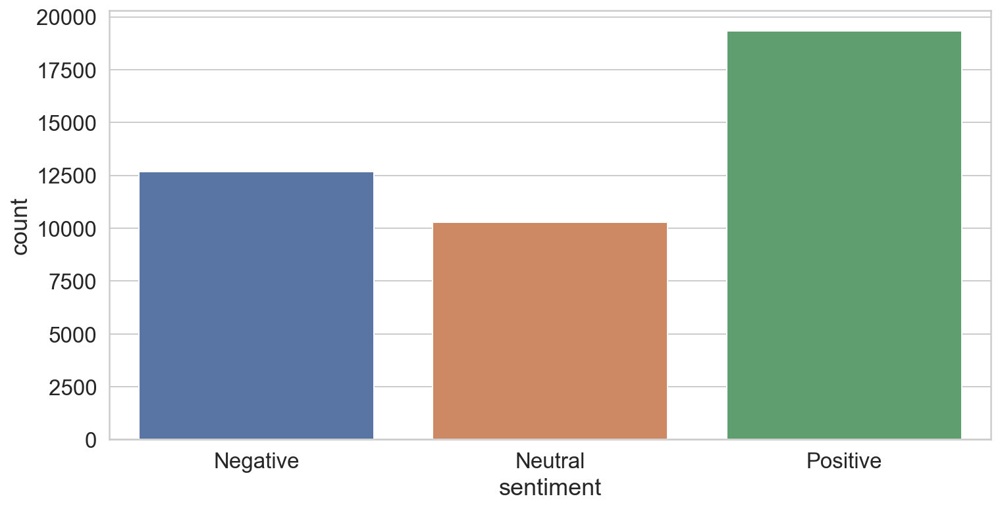

In [44]:
plt.figure(figsize=(12,6))
sns.countplot(x='sentiment',data=df_new)

In [45]:
print(df_new)

                        id        date      time         username  \
0      1330830146857627654  2020-11-23  16:36:47   dharsh17944224   
1      1317801442351218688  2020-10-18  17:45:22    folusoomoliki   
2      1313013820579700736  2020-10-05  12:41:04   itsvedicschool   
3      1332244379017248769  2020-11-27  14:16:26   kartik_nanda10   
4      1332390592085692418  2020-11-27  23:57:26         jburgoss   
...                    ...         ...       ...              ...   
42282  1325048053032607749  2020-11-07  17:40:48    silcharjobs99   
42283  1323809796005322752  2020-11-04  07:40:25          nvyhsnv   
42284  1331225189665759232  2020-11-24  18:46:32       lawanisaac   
42285  1333099645850030082  2020-11-29  22:54:58  prudentwriters6   
42286  1332943977834635264  2020-11-29  12:36:23       adarshrk13   

                                                   tweet language  \
0      In this period, the online classes and the e-b...       en   
1      @ChiefOjukwu @Bashola_Balo

In [46]:
df_new_final = pd.concat([df_new.iloc[0:40000]])

In [47]:
len(df_new_final)

40000

In [48]:
export_csv = df_new_final.to_csv(r'online exams tweets.csv')